# ABOUT THE CHAPTER

We will discuss two different ways to train it:

*   Using a **"closed-form"** equation that directly computes the model parameters that best fit the model to the training set 
           (.i.e the model parameters that minimize the cost function over the training set).
           
           
 *   Using an iterative optimization approach called **gradient descent(GD)** that gradually tweaks the model parameters to minimize the cost function over the training set, eventually converging to the same set of parameters as the first method.We will look at a few variants of gradient descent that we will use again and adn agin while we study neural networks in Part-II:      **batch GD, mini-batch GD and stochastic GD**
 

**Check notebook for more info on linear regression and other models....**

In [1]:
import  numpy as np 
np.random.seed(42)
m=100
X=2*np.random.rand(m,1)
y=4+3*X+np.random.randn(m,1)

In [2]:
%matplotlib inline

In [3]:
import matplotlib.pyplot as plt

import seaborn as sns

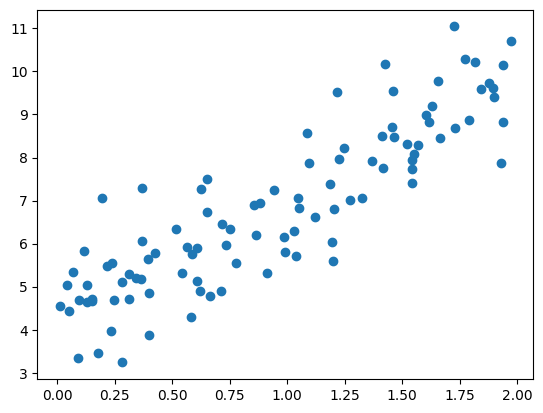

In [4]:
plt.scatter(X,y)
plt.show()

In [5]:
from sklearn.preprocessing import add_dummy_feature
X_b=add_dummy_feature(X)
theta_best=np.linalg.inv(X_b.T@X_b)@X_b.T@y

In [6]:
theta_best

array([[4.21509616],
       [2.77011339]])

In [7]:
X_new=np.array([[0],[2]])
X_new_b=add_dummy_feature(X_new)

In [8]:
y_predict=X_new_b@theta_best
y_predict

array([[4.21509616],
       [9.75532293]])

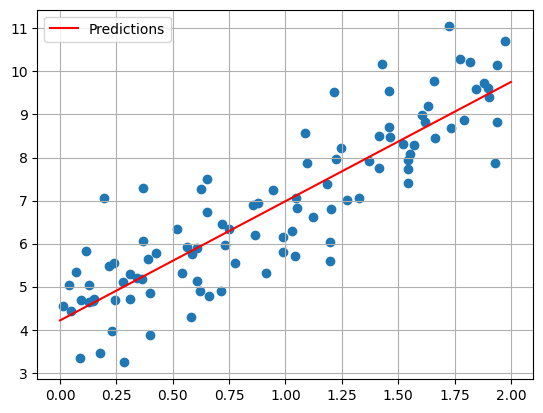

In [9]:
plt.plot(X_new,y_predict,"r-",label="Predictions")
plt.legend(loc="upper left")
plt.scatter(X,y)
plt.grid()
plt.show()

In [10]:
from sklearn.linear_model import LinearRegression
lin_reg=LinearRegression()
lin_reg.fit(X,y)
lin_reg.intercept_,lin_reg.coef_


(array([4.21509616]), array([[2.77011339]]))

In [11]:
lin_reg.predict(X_new)

array([[4.21509616],
       [9.75532293]])

# Computational Complexity

The *Normal equation* computes the inverse of X^TX,which is an **(n+1)x(n+1)** matrix (where n is the number of features). The computational complexity of inverting such a matrix is typically about **O($n^(2.4)$) to O($n^3$)**, depending on the implementation. In other words, if you double the number of features, you multiply the computation time by roughly 2^2.4=5.3 to 2^3=8.

Here **O(n)** is the Big O notation.

Big O notation is a mathematical notation that is used to describe the efficiency of an algorithm. It helps us analyze and compare the performance of different algorithms in terms of their time and space complexity. The notation is particularly useful for measuring the worst-case scenario of an algorithm.

In Big O notation, the "O" stands for "order of magnitude" and represents the upper bound or the worst-case complexity of an algorithm. It describes how the runtime or space requirements of an algorithm grow as the input size increases.

For example, if an algorithm has a time complexity of O(n), it means that the runtime of the algorithm grows linearly with the size of the input. If the input size doubles, the runtime will also double. Similarly, if an algorithm has a space complexity of O(n), it means that the space required by the algorithm grows linearly with the size of the input.

The notation also allows us to compare the efficiency of different algorithms. For instance, if algorithm A has a time complexity of O(n) and algorithm B has a time complexity of O(n^2), it means that algorithm B will be less efficient than algorithm A for large input sizes.

It's important to note that Big O notation only provides an upper bound on the complexity of an algorithm. It does not give precise details about the actual running time or space usage. However, it helps us understand the general trend of how an algorithm scales with input size.

In conclusion, Big O notation is a mathematical notation used to describe the efficiency of algorithms in terms of time and space complexity. It allows us to analyze and compare the performance of algorithms and determine their scalability. [(1)](https://www.freecodecamp.org/news/big-o-notation-why-it-matters-and-why-it-doesnt-1674cfa8a23c/)

# GRADIENT DESCENT

**Gradient descent** is a generic optimzation algorithm capable of finding optimal solutions to wide range of problems. The general idea of gradient descent is to tweak parameters iteratively in order to minimize a cost function.

It measures the  local gradient of the error function with regard to the parameter vector 0, and it goes in the direction 
of descending gradient. Once the gradient is zero, you have reached a minimum!

In practice, you start by filling 0 with random values (this is called random initialization). Then you improve it gradually, 
taking one baby step at a time, each step attempting to decrease the cost function (eg., the MSE) until the algorithm converges
to a minimum.

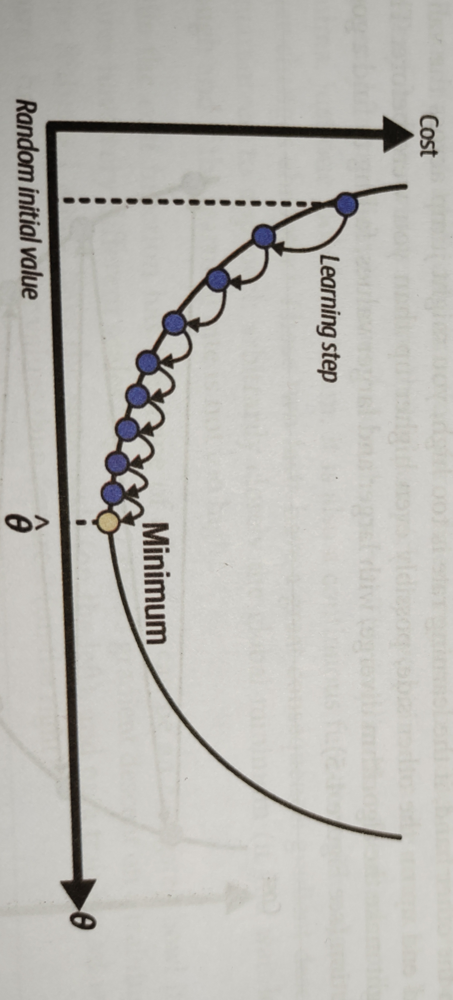

An important parameter in gradient descent is the size of the steps, determined by the learning rule by the hyper parameter. If the learning rate is too small, then the algorithm will have to go through many iterations to converge which will take a long time.

On the other hand, if the learning rate is too high, one might jump the valley and reach the other side, possibly even higher up than you were before. This might make the algorithm diverge, with larger and larger values, failing to find a good solution.

 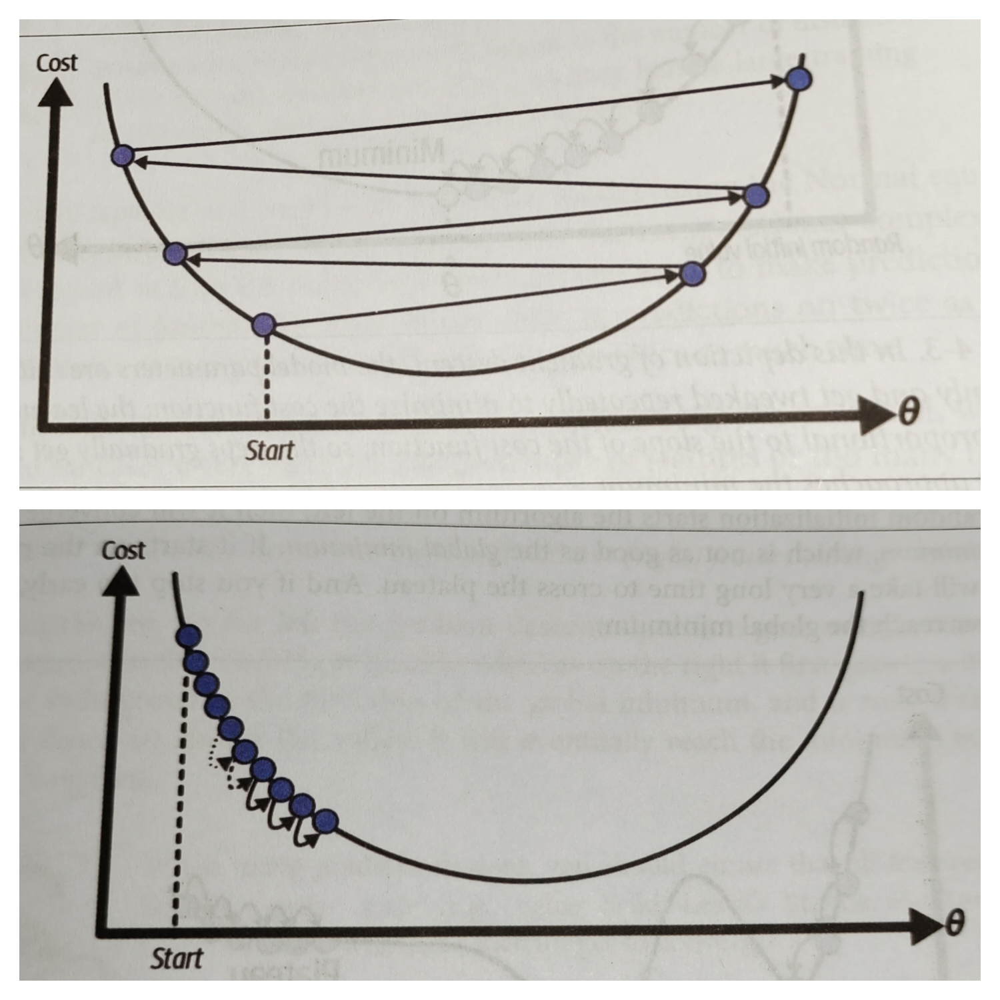

Additionally ,not all cost functions look like nice,regular bowls. There may be holes,ridges, plateaus and all sorts of irregular terrain,making convergence to the minimum difficult.



If random initialization starts the algorithm on the left then it will converge to a local minimum which is not as good as the global minimum.


# BATCH GRADIENT DESCENT

To implement gradient descent, you need to compute the gradient of the cost function with regard to each model parameter $0_{j}$.In other words, you need to calculate how much the cost function will change if you change $0_j$ just a little bit. This is called a partial derivative. Its like asking, "What is the slope of the mountain under my feet if I face east"?

 Notice the formala involves calculations over the full training set X, at each gradient descent step! This is why the algorthm is called batch gradient desceent: it uses the whole batch of training data at every step (actually, full gradient descent would probably be a better name). As a result, it is terribly slow on very large training sets (we will look at some much faster gradient descent algorithms).However, gradient descent scales well with the number of features; training a linear regression model when there are hundreds of thousands of features is much faster using gradient descent than using the Normal Equation or SVD decomposition.
 

Once yoou have the gradient vector which points uphill,just go in the opposite direction to go downhill. 

$0^{(next step)}$=0 - ɳMSE(0)

In [12]:
eta=0.1                    # ɳ - learning rate
n_epochs=1000
m=len(X_b)                 # number of instances

np.random.seed(42)
theta=np.random.randn(2,1)

for epoch in range(n_epochs):
    gradients=2/m*X_b.T@(X_b@theta-y)
    theta=theta-eta*gradients

In [13]:
theta

array([[4.21509616],
       [2.77011339]])

# STOCHASTIC GRADIENT DESCENT

The main problem with batch gradient descent is the fact that it uses the whole training set to compute the gradients at every step, which makes it very slow when the training set is large. At the opposite extreme, stochastic gradient descent picks a random instance in the training set at every step and computes the gradients based only on that single instance. Obviously, working on a simple instance at a time makes the algorithm much faster because it has very little data to manipulate at every iteration. It makes it possible to train on huge training sets, since only one instance needs to be in memory at each iteration.

On the other hand due to its stochastic(i.e.,random) nature, this algorithm is much less regular than batch gradient descent: instead of gently decreasing  until it  reaches the minimum, the cost function  will bounce up and down decreasing only on average. Over time it will end up very close to the minimum, but once it gets there it will continue to bounce around,never settling down. Once the algorithm stops, the final parameter values will be good, but not optimal.

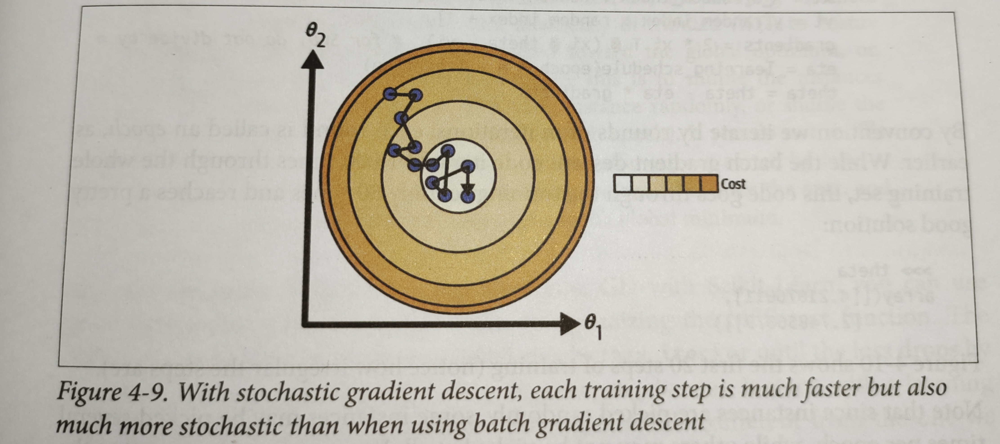

When the cost function is very irregular, this can actually help the algorithm jump out of local minima, so stochastic gradient descent has a better chance of finding the global minimum than batch gradient descent does.

Therefore, randomness is good to escape from the local optima, but bad because it means that the algorithm can never settle at the minima. One solution to this dilemma is to gradually reduce the learning rate. The steps start out large(which helps make quick progress and escape local minima),then get smaller and smaller, allowing the algorithm to settle at the global minima. This process is akin to simulated annealing, an algorithm inspired by the process in metallurgy of annealing, where molten metal is slowly cooled down. The function that determines the learning rate at each iteration is called the learning schedule. If the learning rate is reduced too quickly, you may get stuck in a local minimum or even end up frozen halfway to the minimum. If the learning  rate is reduced too slowly, you may jump around the minimum for a long time and end up with a suboptimal solution if you halt training too early.

In [14]:
n_epochs = 50
t0,t1=5,50

def learning_schedule(t):
    return t0/(t+t1)

np.random.seed(42)
theta=np.random.randn(2,1)

for epoch in range(n_epochs):
    for iteration in range(m):
        random_index=np.random.randint(m)
        xi=X_b[random_index:random_index+1]
        yi=y[random_index:random_index+1]
        gradients=2*xi.T@(xi@theta-yi)
        eta=learning_schedule(epoch*m+iteration)
        theta=theta-eta*gradients

In [15]:
theta

array([[4.21076011],
       [2.74856079]])

When using stochastic gradient descent, the training instances must be independent and identically distributed(IID) to ensure that the parameters get pulled  toward the gloabal optimum, on average. A simple way to ensure this is to shuffle the instances during training(eg., pick each instance randomly, or shuffle the training set at the beginning of each epoch). If you do not shuffle the instances- for example, if the instances are sorted by label- then SGD will start by optimizing for one label , then the next, and next and so on, and it will not settle close to the global minimum.

In [16]:
from sklearn.linear_model import SGDRegressor

sgd_reg=SGDRegressor(max_iter=1000,tol=1e-5,penalty=None,eta0=0.01,n_iter_no_change=100,random_state=42)
sgd_reg.fit(X,y.ravel())                          #y.ravel() beacuse fit() expects 1D targets

SGDRegressor(n_iter_no_change=100, penalty=None, random_state=42, tol=1e-05)

In [17]:
sgd_reg.intercept_,sgd_reg.coef_

(array([4.21278812]), array([2.77270267]))

# MINI-BATCH GRADIENT DESCENT

The last Gradient Descent algorithm we will look at is called Mini-batch Gradient
Descent. It is quite simple to understand once you know Batch and Stochastic Gradi‐
ent Descent: at each step, instead of computing the gradients based on the full training set (as in Batch GD) or based on just one instance (as in Stochastic GD), Mini-
batch GD computes the gradients on small random sets of instances called mini-
batches. The main advantage of Mini-batch GD over Stochastic GD is that you can
get a performance boost from hardware optimization of matrix operations, especially
when using GPUs.


The algorithm’s progress in parameter space is less erratic than with SGD, especially
with fairly large mini-batches. As a result, Mini-batch GD will end up walking
around a bit closer to the minimum than SGD. But, on the other hand, it may be
harder for it to escape from local minima (in the case of problems that suffer from
local minima, unlike Linear Regression as we saw earlier). Figure 4-11 shows the
paths taken by the three Gradient Descent algorithms in parameter space during
training. They all end up near the minimum, but Batch GD’s path actually stops at the
minimum, while both Stochastic GD and Mini-batch GD continue to walk around.
However, don’t forget that Batch GD takes a lot of time to take each step, and Stochas‐
tic GD and Mini-batch GD would also reach the minimum if you used a good learn‐
ing schedule.

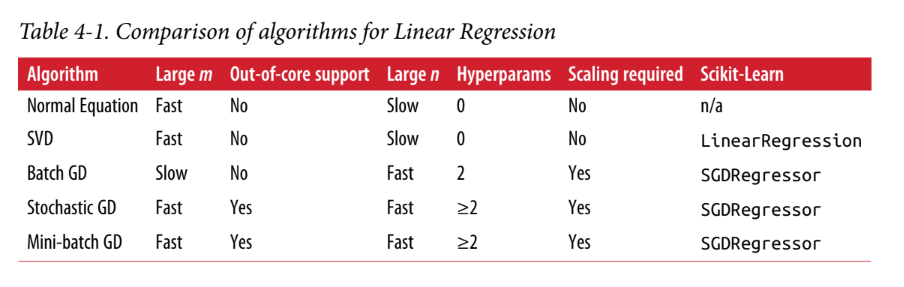

There is almost no difference after training: all these algorithms end up with very similar models and make predictions in exactly same way.

# POLYNOMIAL REGRESSION

What if your data is more complex than a straight line?Suprisingly, you can use a linear model to fit nonlinear data. A simple way to do this is to add powers of each feature as new features, then train a linear model on this extended set of features This technique  is called *polynomial regression*.

For example: First we'll generate some nonlinear data based on a simple quadratic equation-that's an equation of the form y=a$x^{2}$+bx+c  - plus some noise.

In [18]:
np.random.seed(42)
m=100
x=6 * np.random.rand(m,1) - 3
y=0.5 * x ** 2 + x + 2 + np.random.randn(m,1)

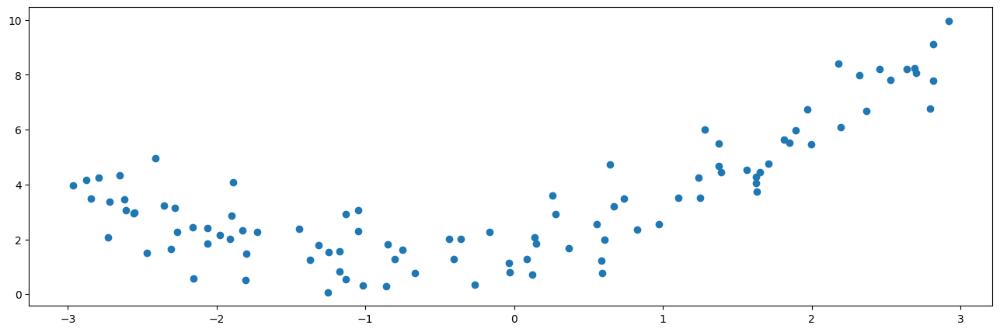

In [19]:
plt.figure(figsize=(16,5))
plt.scatter(x,y)

In [20]:
from sklearn.preprocessing import PolynomialFeatures
poly_features=PolynomialFeatures(degree=2,include_bias=False)
X_poly=poly_features.fit_transform(x)

In [21]:
x[0]

array([-0.75275929])

In [22]:
X_poly[0]

array([-0.75275929,  0.56664654])

In [23]:
lin_reg=LinearRegression()
lin_reg.fit(X_poly,y)
lin_reg.intercept_,lin_reg.coef_


(array([1.78134581]), array([[0.93366893, 0.56456263]]))

Not bad: the model estimates $\hat{y}=0.5x_{1}^{2}+0.93x_{1}+1.78$ is the real equation when it is in fact $\hat{y}=0.5x_{1}^{2}+x_{1}+2.0+$ **Guassian  noise**

Note that when there are multiple features, polynomial regression is capable of finding relationships between features,which is something a plain linear  regression model cannot do. This is made possible by the fact that the *Polynomial Features* also adds 
all combinations of features up to the given degree.

# LEARNING CURVES

If you perform high degree polynomial regression, you will likely fit the training data much better than with plain linear regression. For example: when we apply a 300-degree polynomial model to the preceeding training data, and compares the result with a pure linear model and a quadratic model(second degree polynomial). Notice how the 300-degree polynomial model wiggles around to get as close as possible to the training instances.

This high degree polynomial equation is severely overfitting the training data,while the linear model is underfitting it. The model that will generalize best in this case is the quadratic model, which makes sense because the data was generated using a quadratic model. But in general you won't know what function generated the data, so how can you decide how complex your model should be? How can you tell that your model is overfitting or underfitting the data?

 We had earlier used cross-validation to get an estimate of a model's generalization performance. If a model performs well on training data but generalizes poorly according to the cross-validation metrics, then your model is overfitting.If it performs poorly on both, then it is underfitting. This is one way to tell when a model is too simple or too complex.

Another way to tell is to look at the learning curves,which are plots of the model's training error and validation error as a function of the training iteration: just evaluate the model at regualr intervals during the training on both the training set and the validation set and plot the results. If the model cannot be trained incrementally(i.e., if it does not support partial_fit() or warm_start), then you must train it several times on gradually larger subsets of the training set.


In [24]:
from sklearn.model_selection import learning_curve

train_sizes,train_scores,valid_scores=learning_curve(LinearRegression(),X_poly,y,train_sizes=np.linspace(0.01,1.0,40),cv=5,scoring="neg_root_mean_squared_error")
train_errors=train_scores.mean(axis=1)
valid_errors=valid_scores.mean(axis=1)

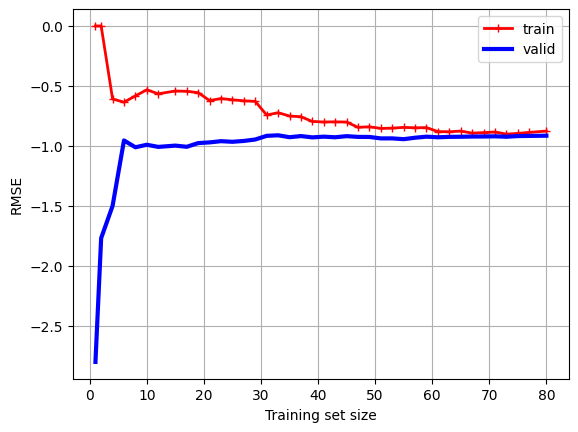

In [25]:
plt.plot(train_sizes,train_errors,"r-+",linewidth=2,label="train")
plt.plot(train_sizes,valid_errors,"b-",linewidth=3,label="valid")
plt.legend(loc="upper right")
plt.grid()
plt.ylabel("RMSE")
plt.xlabel("Training set size")
plt.show()

In [26]:
train_errors

array([ 0.00000000e+00, -1.42404278e-15, -6.08912867e-01, -6.36069811e-01,
       -5.83572544e-01, -5.32612071e-01, -5.66379088e-01, -5.42566529e-01,
       -5.45289072e-01, -5.56364091e-01, -6.22343529e-01, -6.05393678e-01,
       -6.16010984e-01, -6.24530596e-01, -6.29352914e-01, -7.43386305e-01,
       -7.23652915e-01, -7.51342913e-01, -7.57176622e-01, -7.96868904e-01,
       -8.01000593e-01, -7.99872167e-01, -8.01699543e-01, -8.45787065e-01,
       -8.41046543e-01, -8.54869573e-01, -8.52389864e-01, -8.46303065e-01,
       -8.49319986e-01, -8.47912762e-01, -8.81230424e-01, -8.82556808e-01,
       -8.77025748e-01, -8.93841883e-01, -8.89719198e-01, -8.84606018e-01,
       -9.02105695e-01, -8.96529260e-01, -8.87949873e-01, -8.76569756e-01])

In [27]:
valid_errors

array([-2.80211523, -1.76983269, -1.50121807, -0.95511215, -1.01208179,
       -0.9910171 , -1.00888319, -0.99813828, -1.00806692, -0.97701668,
       -0.97136345, -0.961161  , -0.96635176, -0.95923888, -0.94721077,
       -0.91673463, -0.91209382, -0.92805534, -0.91861556, -0.92951321,
       -0.92361842, -0.92852909, -0.91939051, -0.92545869, -0.92603823,
       -0.93804569, -0.937866  , -0.94446282, -0.93238383, -0.92354972,
       -0.92872603, -0.92508618, -0.92434027, -0.92257302, -0.92223986,
       -0.92071192, -0.92407159, -0.91875903, -0.91735254, -0.91549541])

This model is underfitting. To see why, first let's look at the training error. When there are just one or two instances in the training set, the model can fit them perfectly, which is why the curve starts at zero. But as new instances are added to the training set, it becomes impossible for the model to fit the training data perfectly, both because the data is noisy and because it is not linear at all. So the error on the training data goes up until it reaches a plateau, at which point adding new instances to the training set doesn't make the average error much better or worse. Now let's look at the the validation error. When the model is trained on a very few training instances, it is incapable of generalizing properly, which is why the the validation error is initially quite large. Then, as the model is shown more training examples, it learns and thus the validation error slowly goes down. However, once again a straight line cannot do a good job of modelling the data, so the error ends up a plateau, very close to the other curve.

In [28]:
from sklearn.pipeline import make_pipeline
import sklearn
polynomial_regression=make_pipeline(PolynomialFeatures(degree=10,include_bias=False),LinearRegression())

train_sizes,train_scores,valid_scores=learning_curve(polynomial_regression,X_poly,y,train_sizes=np.linspace(0.01,1.0,40),cv=5,scoring="neg_mean_absolute_error")

In [29]:
train_errors=train_scores.mean(axis=1)
valid_errors=valid_scores.mean(axis=1)

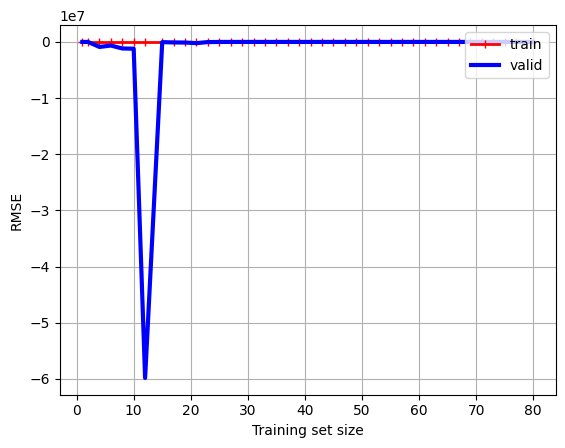

In [30]:
plt.plot(train_sizes,train_errors,"r-+",linewidth=2,label="train")
plt.plot(train_sizes,valid_errors,"b-",linewidth=3,label="valid")
plt.legend(loc="upper right")
plt.grid()
plt.ylabel("RMSE")
plt.xlabel("Training set size")
plt.show()

These learning curves look a bit like the previous ones, but there are are two very important differences:
* The error on the training data is much lower than before.
* There is a gap between the curves. This means that the model performs significantly better on th training data than on the validation data, which is the hallmark of an overfitting model. if you used  a much larger training set, however, the two curves would continue to get closer.

# The Bias/Variance Trade-Off

An important theoretical result of statistics and machine learning is the fact that a model's generalization error can be expressed as the sum of three very different errors:

**Bias:**
This is the part of generalization error is due to wrong assumptions, such as  assuming that the data is linear when it is actually quadratic, a high bias model is most likely to undefit the training data.


**Variance:**
This part is due to the model's excessive sensitivity to small variations in the training data. A model with many degrees of freedom (such as high-degree polynomial model) is likely to have high variance and thus overfit the training data.


**Irreducible error:**
This  is the part id due to the noisiness of the data itself. The only way to reduce this part of the error is to clean up the data(e.g., fix the data sources, such as broken sensors, or detect and remove outliers).

Increasing a model's complexity will typically increase its variance and reduce its bias. Conversely, reducing a model's complexity increases its bias and reduces its variance. This is why it called a trade-off.

# REGULARIZED LINEAR MODELS 

As you saw in Chapters 1 and 2, a good way to reduce overfitting to regularize the model(i.e, to constraint it): the few degrees of freedom it has , the higher it will be for it to overfit the data. A simple way to regularize a polynomial model is to reduce  the number of  polynomial degrees.


# RIDGE REGRESSION

Ridge regression (also called Tikhonov regularization) is a regularized version of linear regression: a regularization term is added to  the MSE. This forces the learning algorithm to not only fit the data but also keep  the model weights as small as possible. Note that the  regularization term should only be added to  the cost function during training. Once the model is trained, you want to use the unregularized MSE (or the RMSE) to evaluate the model's performance


The hyperparameter *$ɑ$* controls how much you want to regularize the model. If *$ɑ$* is very large, then all weights end up very close to zero and the result is a flat line going through the data's mean-equation which presents the regression cost function.


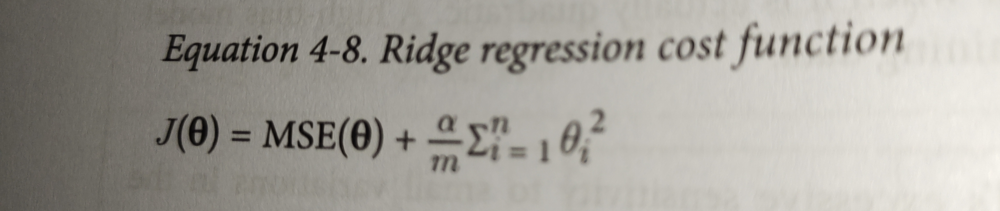

Note that the bias term $ʘ_{0}$ is not regularized (the sum starts at i=1, not 0). If we define w as the vector of feature weights ($ʘ_{1}$ to $ʘ_{n}$), then the regularization term is equal to $ɑ$$($||w||_{2}$)^{2}$ / m where $||w||_{2}$ represents the $l_{2}$ norm of the weight vector. For batch gradient descent, just add **2*ɑ*w/m** to the part of the MSE gradient vector. That corresponds to the feature weights, without adding anything to the gradient of the bias term.

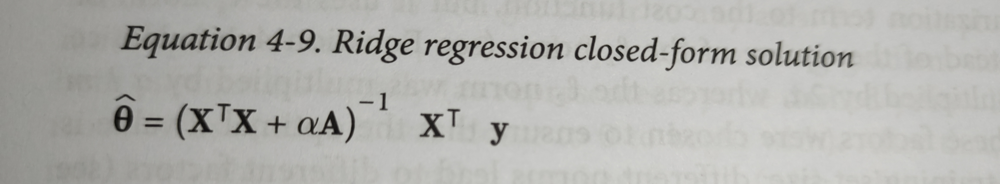

# 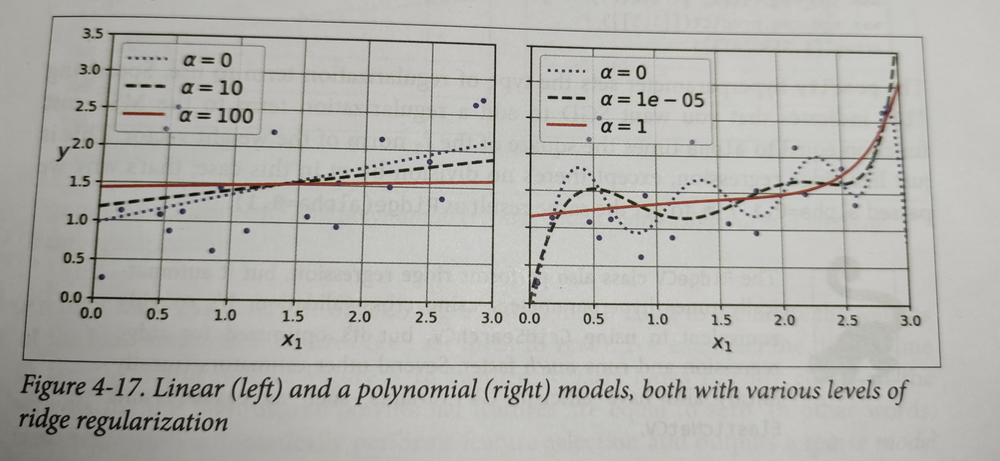

In [31]:
from sklearn.linear_model import Ridge
ridge_reg=Ridge(alpha=0.1,solver="cholesky")
ridge_reg.fit(X,y)
ridge_reg.predict([[1.5]])

array([[4.82541643]])

In [32]:
sgd_reg=SGDRegressor(penalty="l2",alpha=0.1/m,tol=None,max_iter=1000,eta0=0.01,random_state=42)
sgd_reg.fit(X,y.ravel())
sgd_reg.predict([[1.5]])

array([4.82759124])

The penalty hyperparameter sets the type of regularization term to use. Specifying "l2" indicates that you want to use SGD to add a regularization term to the MSE cost function to equal to *alpha* times the square of the $l_{2}$ norm of the weight vector. This is just like ridge regression, except there's no division by *m* in this case; that's why we passed alpha=0.1/m, to get the same result as Ridge( alpha = 0.1 ).



**JUST TO REMIND MYSELF:😒**
* **Epoch:** No of transitions across the training dataset

* **Hyperparameters:** values set by us using coeff and intercept of the model

* **Parameters:** values figured out during the training session of the dataset


# LASSO REGRESSION

Least absolute shrinkage and selection operator regression(usually simply called lasso  regression) is another regularized version of linear regression: just like ridge regression, it adds a regularization term to the cost function, but it uses the $l_{1}$ norm of tge weight vector instead of the square of the $l_{2}$ norm. Notice that the l1 norm is multiplied by 2*ɑ*,
whereas the $l_{2}$ norm was multiplied by an ɑ/m in ridge regression. These factors were chosen to ensure that the optimal ɑ 
value is independent from the training set size:different norms lead to different factors

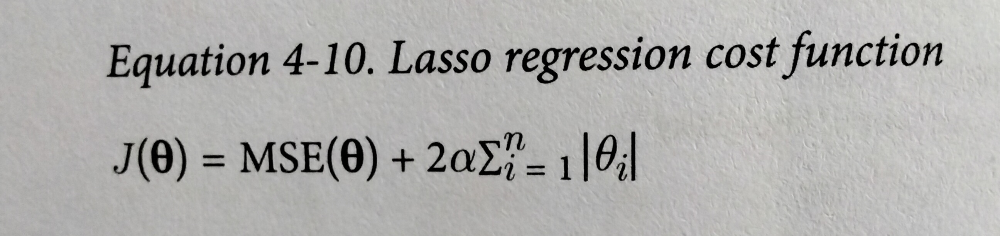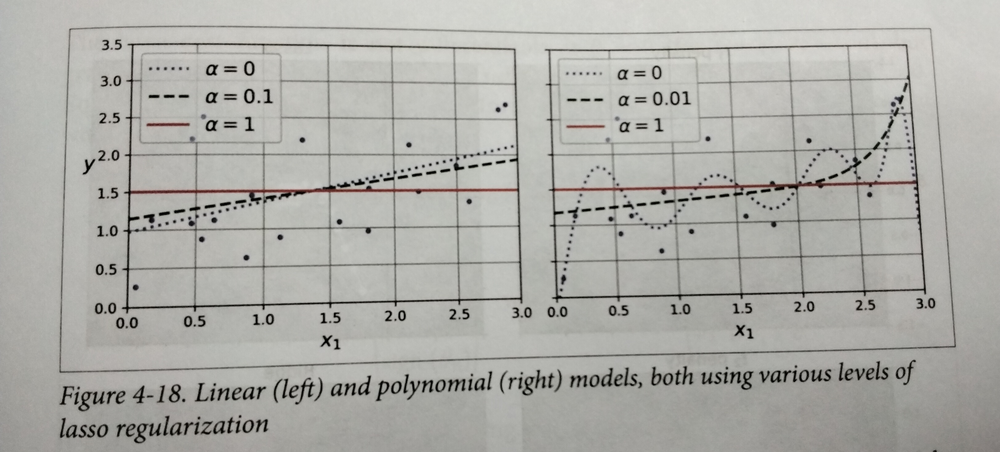

An important characteristic of lasso regression is that it tends to eliminate the weights of the least importatn features(i.e., set them to zero). For example: the dashed line in the righthand plot in Figure 4.18 (with ɑ = 0.01) looks roughly cubic: all the weights for the high-degree polynomial features are equal to zero. In other words, lasso regression automatically performs feature selection and outputs a sparse model with few nonzero feature weights.

You can get a sense of why this is the case by looking at Figure 4.19: the axes represent two model parameters and the background contours represent different loss functions. In the top-left plot, the contours represent the $l_{1}$ loss which drops linearly as you get closer to any axis. For example,if you initialize the model parameters equally(as represented by the yellow dashed line); therefore 02 will reach 0 first (since it was closer to 0 to begin with). After that, the gradient descent will roll down the gutter  until it reaches 01=0 (witha bit of bouncing around, since the gradients of l1, never get close to 0: they are either -1 to 1 for each parameter). In the top-right plot, the contours represent lasso regression's cost function (i.e., an MSE cost function plus an l1 loss). The small white circles show the path that gradient descent takes to otimize some model parameters that were initialized around $0_{1}$=0.25 and $0_{2}=-1$: notice once again how the path quickly reaches $0_{2}$=0, then rolls down the gutter and ends up bouncing around the global optimum (represented by the red square). If we increased *ɑ*, the global optimum would move left along the dashed yellow line, while if we decreased *ɑ* the global would move right (in this example, the original parameters for the unregularized MSE are $0_{1}$=2 and $0_{2}$=0.5).

**Check book**
PG 160

The two  bottom plots show the same thing but with an $l_{2}$ penalty instead. In the bottom-left plot, you can see that the $l_{2}$ loss decreases as we get closer  to the origin, so gradient descent just takes a straight path towards that point. In the bottom-right plot, the contours represent ridge regression's cost function (i.e., an MSE cost function plus an $l_{2}$ loss). As you can see, the gradients get smaller as the parameters approach the global optimum,so gradient descent naturally slows down. This limits the bouncing around,which helps the ridge converge faster than lasso regression. Also note that the optimal parameters(represented by the red square) gets closer and closer to the origin when you increase *ɑ*, but they never get eliminated entirely.

In [37]:
from sklearn.linear_model import Lasso
lasso_reg=Lasso(alpha=0.1)
lasso_reg.fit(X,y)
lasso_reg.predict([[1.5]])

array([4.66975945])

Ridge and lasso regression are two types of regularization techniques for linear models. They both aim to reduce the complexity of the model and prevent overfitting by adding a penalty term to the cost function. The difference between them is how they apply the penalty.

Ridge regression uses the L2 norm of the coefficients as the penalty term, which means it takes the square of the coefficients and adds them to the cost function. This shrinks all the coefficients by a small amount, but does not eliminate any of them completely. Ridge regression is useful when there are many features that are correlated with each other, and we want to keep all of them in the model.

Lasso regression uses the L1 norm of the coefficients as the penalty term, which means it takes the absolute value of the coefficients and adds them to the cost function. This encourages some of the coefficients to become exactly zero, which means they are removed from the model. Lasso regression is useful when there are many features that are not relevant or redundant, and we want to perform feature selection.

# ELASTIC NET REGRESSION

*Elastic net regression* is a middle ground between ridge regression and lasso regression. The regularization term is the weighted sum of both ridge and lasso's regularization terms, and you can control the mix ratio r. When r =0, elastic net regression is equivalent to ridge regression and when r =1, it is equivalent to lasso regression.

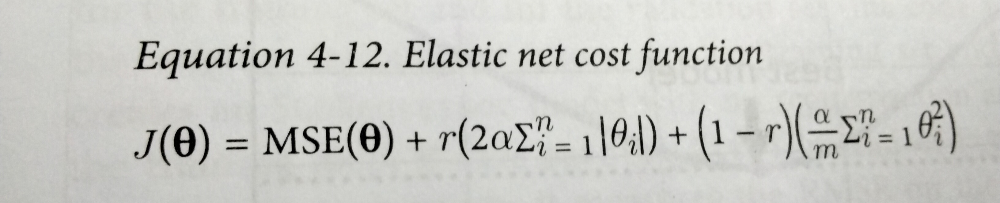

So when should you use elastic net regression, or ridge,lasso, or plain linear regression (i.e. without any regularization)? It is almost always preferable to have at least a little bit of regularization, so generally you should avoid plain linear regression. Ridge is a good default, but if you suspect that only a few features are useful, you should prefer lasso or elastic net because they tend to reduce the useless features' weights down to zero, as discussed earlier. In general, elastic net is preferred over lasso because lasso may behave erratically when the number of features is greater than the number of training instances or when several features are strongly correlated.